In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling

In [2]:
Url ="http://archive.ics.uci.edu/ml/machine-learning-databases/00514/Bias_correction_ucl.csv"

In [3]:
Data = pd.read_csv(Url)

In [4]:
Data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
Data.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
Data.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


In [7]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [8]:
Data.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
Data[Data['station'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [10]:
Data[Data['Date'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [11]:
for I in Data.columns:
    print(Data[Data[I].isna()])  # all null values in the rows wise Find null Values

      station Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
7750      NaN  NaN          20.0          11.3    19.794666    58.936283   
7751      NaN  NaN          37.6          29.9    98.524734   100.000153   

      LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS    LDAPS_LH  ...  \
7750         17.624954         14.272646   2.882580  -13.603212  ...   
7751         38.542255         29.619342  21.857621  213.414006  ...   

      LDAPS_PPT2  LDAPS_PPT3  LDAPS_PPT4      lat      lon      DEM     Slope  \
7750    0.000000    0.000000    0.000000  37.4562  126.826   12.370  0.098475   
7751   21.621661   15.841235   16.655469  37.6450  127.135  212.335  5.178230   

      Solar radiation  Next_Tmax  Next_Tmin  
7750      4329.520508       17.4       11.3  
7751      5992.895996       38.9       29.8  

[2 rows x 25 columns]
      station Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
7750      NaN  NaN          20.0          11.3    19.794666    58.936283 

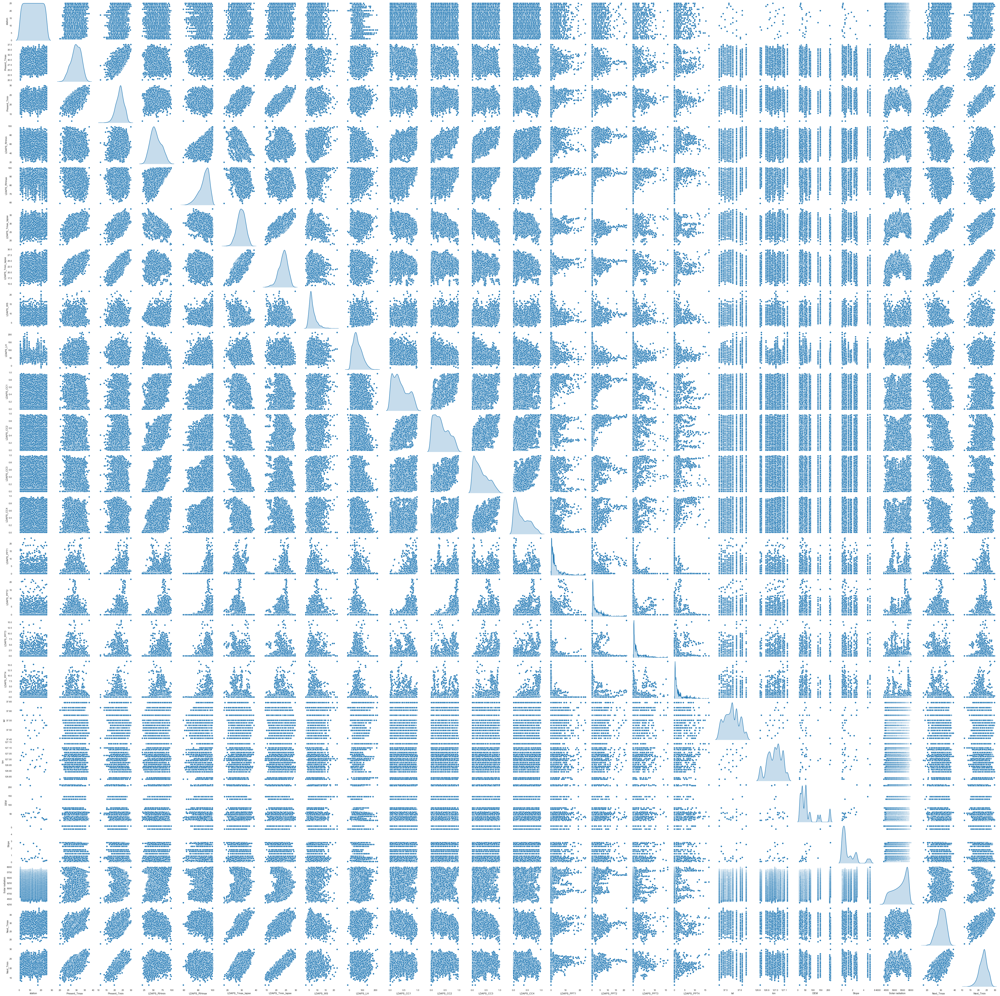

In [56]:
sns.pairplot(Data,diag_kind="kde")
plt.savefig("Pairplot.png",dpi=300)

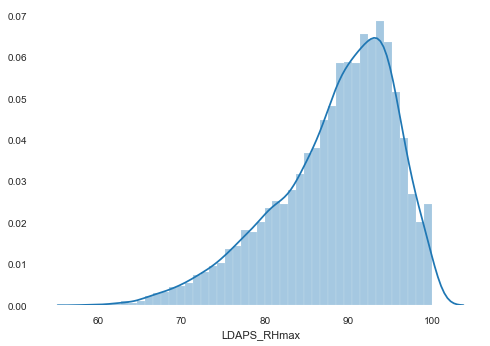

In [24]:
sns.distplot(Data.LDAPS_RHmax)

In [12]:
plot = Data.drop('Date',axis=1)

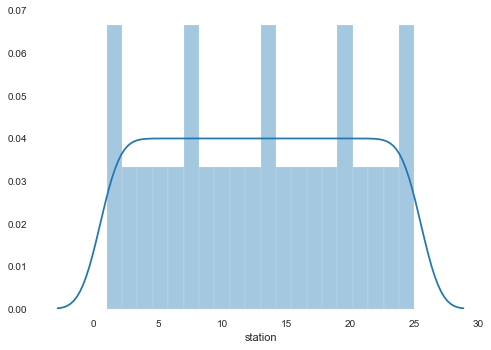

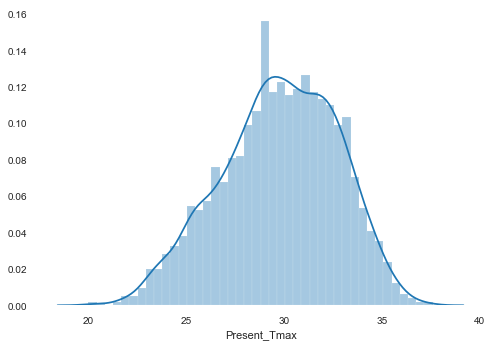

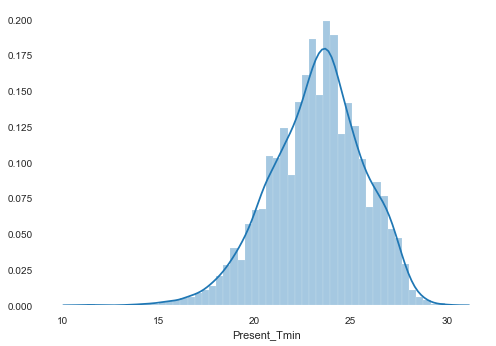

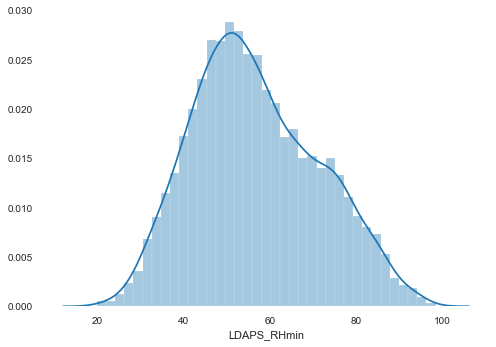

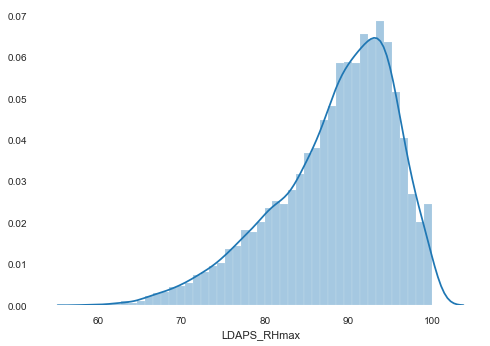

...

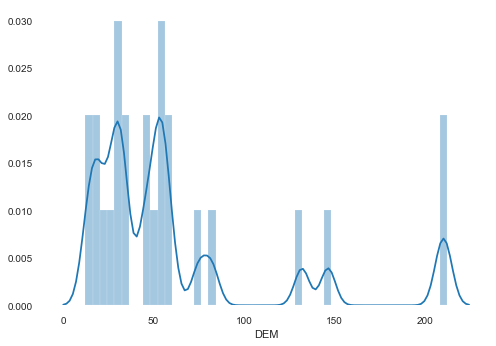

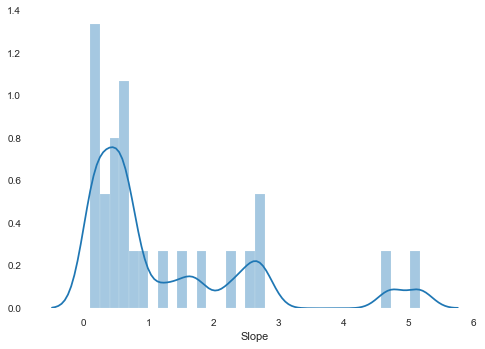

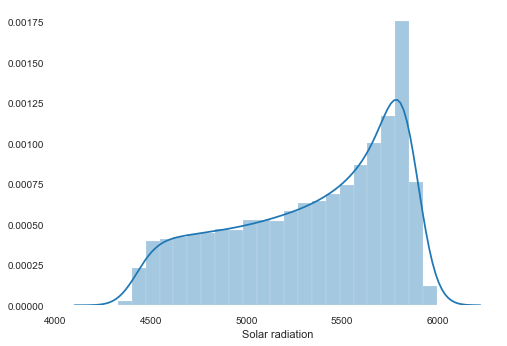

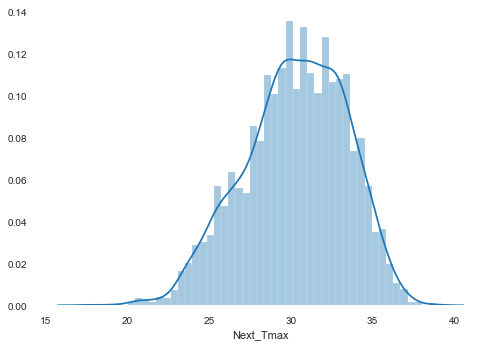

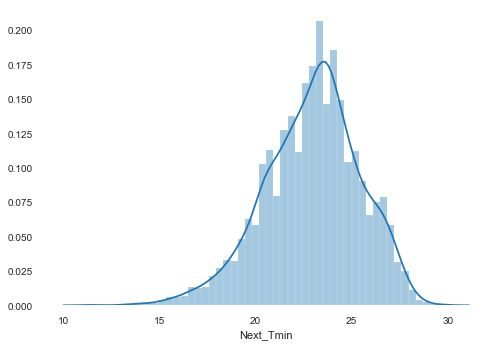

In [13]:
for I in plot.columns:
    sns.distplot(plot[I])
    plt.show()

TypeError: unsupported operand type(s) for /: 'str' and 'int'

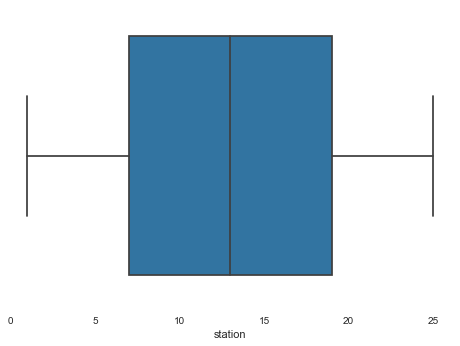

In [14]:
for I in Data.columns:
    sns.boxplot(Data[I])

In [15]:
Data.dropna(axis=1,how='all',inplace=True)

In [16]:
Max = Data[['Present_Tmax','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT4',
          'lat','lon','DEM','Slope','Solar radiation','Next_Tmax']]

In [17]:
Max.head()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5
2,31.6,83.973587,30.091292,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1
3,32.0,96.483688,29.704629,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7
4,31.4,90.155128,29.113934,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2


In [18]:
Max.tail()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
7747,23.3,78.869858,26.352081,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3
7748,23.3,77.294975,27.010193,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6
7749,23.2,77.243744,27.939516,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8
7750,20.0,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4
7751,37.6,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9


In [19]:
Max.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Present_Tmax      7682 non-null   float64
 1   LDAPS_RHmax       7677 non-null   float64
 2   LDAPS_Tmax_lapse  7677 non-null   float64
 3   LDAPS_WS          7677 non-null   float64
 4   LDAPS_LH          7677 non-null   float64
 5   LDAPS_CC1         7677 non-null   float64
 6   LDAPS_CC2         7677 non-null   float64
 7   LDAPS_CC3         7677 non-null   float64
 8   LDAPS_CC4         7677 non-null   float64
 9   LDAPS_PPT1        7677 non-null   float64
 10  LDAPS_PPT4        7677 non-null   float64
 11  lat               7752 non-null   float64
 12  lon               7752 non-null   float64
 13  DEM               7752 non-null   float64
 14  Slope             7752 non-null   float64
 15  Solar radiation   7752 non-null   float64
 16  Next_Tmax         7725 non-null   float64


In [20]:
Max.describe()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000
mean,29.768211,88.374804,29.613447,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887
std,2.969999,7.192004,2.947191,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010
min,20.000000,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,27.800000,84.222862,27.673499,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000
50%,29.900000,89.793480,29.703426,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000
75%,32.000000,93.743629,31.710450,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000
max,37.600000,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


In [21]:
Feature = Max.drop(['Next_Tmax'],axis=1)
Feature.head(2)

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500


In [22]:
Feature.replace(np.NaN,0,inplace=True)

In [23]:
Feature.isna().sum()

Present_Tmax        0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
dtype: int64

In [24]:
Target = Max['Next_Tmax']

In [25]:
Target.replace(np.NaN,0,inplace=True)

c:\users\me\appdata\local\programs\python\python36\lib\site-packages\pandas\core\generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [26]:
Target.isna().sum()

0

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
x_train,x_test,y_train,y_test = train_test_split(Feature,Target,test_size=0.1)

In [29]:
x_train.shape

(6976, 16)

In [30]:
y_train.shape

(6976,)

In [31]:
from sklearn.linear_model import LinearRegression

In [32]:
lm = LinearRegression()

In [33]:
lm.fit(x_train,y_train)

LinearRegression()

In [34]:
lm.coef_

array([ 2.17944729e-01, -9.37214344e-02,  3.64580645e-01, -2.67041471e-01,
        6.91913805e-03, -1.03259976e+00,  4.29625856e-01, -1.56874797e+00,
       -1.40173397e+00,  1.18059569e-01,  6.59599511e-02,  1.08640799e+00,
       -1.98889447e+00, -6.24851562e-03,  3.10553509e-01,  7.68731454e-04])

In [35]:
lm.intercept_

231.41762877907826

In [36]:
Train_score = lm.score(x_train,y_train)
Train_score

0.5295973629529871

In [37]:
predict = lm.predict(x_test)


In [38]:
Test_score = lm.score(x_test,predict)
Test_score # overfitting

1.0

In [39]:
from sklearn.preprocessing import StandardScaler

In [40]:
ss = StandardScaler()

In [41]:
Scaled_Data = ss.fit_transform(Feature)

In [42]:
pd.DataFrame(Scaled_Data,columns=Feature.columns)

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-0.195796,0.320347,-0.303829,-0.092185,0.221336,-0.497849,-0.573957,-0.611878,-0.649048,-0.302656,-0.222227,1.189286,-0.005000,2.772243,1.115004,1.517935
1,0.587970,0.274775,0.127016,-0.586164,-0.292012,-0.529859,-0.389214,-0.620851,-0.661611,-0.302656,-0.222227,1.189286,0.511177,-0.315157,-0.542158,1.229950
2,0.514492,-0.315859,0.185366,-0.390529,-1.211307,-0.591169,-0.367227,-0.443025,-0.605101,-0.302656,-0.222227,0.653021,0.838510,-0.526218,-0.723133,1.216534
3,0.612462,0.798413,0.091595,-0.604503,0.112166,-0.564511,-0.488652,-0.614027,-0.636015,-0.302656,-0.222227,1.991696,0.385280,-0.297588,0.932424,1.201176
4,0.465506,0.234730,-0.051656,-0.567266,1.350178,-0.810917,-0.396068,-0.543390,-0.495614,-0.302656,-0.222227,0.118743,1.807917,-0.494322,-0.548433,1.207205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,-1.518401,-0.770447,-0.721441,-0.385842,0.297732,-1.271272,-1.048052,-1.255899,-1.162922,-0.302656,-0.222227,-0.149390,-1.263971,-0.852681,-0.803915,-2.093040
7748,-1.518401,-0.910722,-0.561841,-0.213189,-0.429652,-1.249123,-1.071485,-1.255899,-1.162922,-0.302656,-0.222227,-0.417522,-1.037356,-0.821213,-0.755095,-2.104553
7749,-1.542893,-0.915285,-0.336468,0.113988,-1.547875,-1.199513,-1.129729,-1.255899,-1.159798,-0.302656,-0.222227,-0.417522,-0.269384,-0.779043,-0.719338,-2.074325
7750,-2.326659,-2.545926,-2.837883,-1.817526,-2.213017,-1.385188,-1.360750,-1.255899,-1.162922,-0.302656,-0.222227,-1.758184,-2.082302,-0.911963,-0.845455,-2.358212


In [43]:
lm_s = LinearRegression()

In [44]:
Sc_X_Train,Sc_X_Test,Sc_y_Train,Sc_y_Test = train_test_split(Scaled_Data,Target)

In [45]:
lm_s.fit(Sc_X_Train,Sc_y_Train)

LinearRegression()

In [46]:
lm_s.coef_

array([ 0.93497642, -1.06191341,  1.49559529, -0.61041244,  0.24846571,
       -0.26456253,  0.12157838, -0.44045351, -0.35133644,  0.21123483,
        0.09748187,  0.04760379, -0.15100624, -0.33491226,  0.40668689,
        0.32526869])

In [47]:
lm_s.intercept_

30.1778911257371

In [48]:
S_train = lm_s.score(Sc_X_Train,Sc_y_Train)
S_train

0.5500199466989052

In [49]:
s_predication = lm_s.predict(Sc_X_Test)

In [50]:
S_test = lm_s.score(Sc_X_Test,s_predication)
S_test

1.0

In [51]:
np.log(Feature)  # Negative Skew

c:\users\me\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
c:\users\me\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,3.356897,4.512137,3.334847,1.919696,4.240633,-1.452659,-1.590147,-1.822032,-2.033106,-inf,-inf,3.627126,4.844116,5.358165,1.024248,8.698330
1,3.462606,4.506506,3.396208,1.739042,3.950040,-1.489399,-1.379234,-1.836062,-2.057858,-inf,-inf,3.627126,4.844439,3.801369,-0.665337,8.677493
2,3.453157,4.430502,3.404236,1.814535,3.023982,-1.563778,-1.356854,-1.589187,-1.951047,-inf,-inf,3.626408,4.844644,3.505762,-1.323883,8.676511
3,3.465736,4.569374,3.391303,1.731664,4.185512,-1.530756,-1.487210,-1.825374,-2.008061,-inf,-inf,3.628200,4.844360,3.822448,0.930115,8.675387
4,3.446808,4.501532,3.371217,1.746589,4.681812,-1.887784,-1.386313,-1.720970,-1.771833,-inf,-inf,3.625692,4.845250,3.556433,-0.682207,8.675828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,3.148453,4.367799,3.271547,1.816276,4.277475,-3.505419,-2.512874,-inf,-inf,-inf,-inf,3.625332,4.843328,2.746476,-1.861753,8.399156
7748,3.148453,4.347629,3.296214,1.878368,3.855272,-3.327747,-2.590769,-inf,-inf,-inf,-inf,3.624973,4.843470,2.850452,-1.503727,8.398043
7749,3.144152,4.346966,3.330042,1.986403,2.207179,-3.016884,-2.815603,-inf,-7.135719,-inf,-inf,3.624973,4.843951,2.974733,-1.304530,8.400962
7750,2.995732,4.076457,2.869316,1.058686,NaN,-inf,-inf,-inf,-inf,-inf,-inf,3.623172,4.842816,2.515274,-2.317957,8.373212


In [52]:
np.log1p(Feature)   #  Removing Negative Skew

c:\users\me\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log1p
  """Entry point for launching an IPython kernel.


,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,3.391147,4.523053,3.369848,2.056542,4.254929,0.210218,0.185563,0.149882,0.123039,0.000000,0.000000,3.653371,4.851960,5.362864,1.331046,8.698497
1,3.493473,4.517483,3.429159,1.900896,3.969111,0.203356,0.224560,0.147941,0.120204,0.000000,0.000000,3.653371,4.852280,3.823463,0.414821,8.677663
2,3.484312,4.442340,3.436928,1.965464,3.071445,0.190078,0.229101,0.185725,0.132891,0.000000,0.000000,3.652672,4.852483,3.535344,0.235941,8.676682
3,3.496508,4.579685,3.424413,1.894624,4.200612,0.195873,0.203759,0.149417,0.125970,0.000000,0.000000,3.654417,4.852202,3.844087,1.262657,8.675558
4,3.478158,4.512563,3.404988,1.907318,4.691032,0.140985,0.223140,0.164575,0.157022,0.000000,0.000000,3.651974,4.853084,3.584574,0.409125,8.675999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,3.190476,4.380399,3.308793,1.966961,4.291258,0.029592,0.077919,0.000000,0.000000,0.000000,0.000000,3.651624,4.851178,2.808655,0.144447,8.399381
7748,3.190476,4.360483,3.332568,2.020596,3.876219,0.035245,0.072286,0.000000,0.000000,0.000000,0.000000,3.651274,4.851319,2.906661,0.200734,8.398269
7749,3.186353,4.359829,3.365208,2.114961,2.311548,0.047793,0.058145,0.000000,0.000796,0.000000,0.000000,3.651274,4.851796,3.024534,0.240040,8.401186
7750,3.044522,4.093282,2.924502,1.356500,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.649520,4.850670,2.593013,0.093922,8.373443


In [53]:
Feature.replace(np.NaN,0,inplace=True)